Code for **super-resolution** (figures $1$ and $5$ from main paper).. Change `factor` to $8$ to reproduce images from fig. $9$ from supmat.

You can play with parameters and see how they affect the result. 

In [2]:
"""
*Uncomment if running on colab* 
Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab 
"""
!git clone https://github.com/ritusingla/deep-image-prior
!mv deep-image-prior/* ./

Cloning into 'deep-image-prior'...
remote: Enumerating objects: 221, done.
remote: Counting objects: 100% (221/221), done.
remote: Compressing objects: 100% (179/179), done.
remote: Total 529 (delta 68), reused 149 (delta 41), pack-reused 308
Receiving objects: 100% (529/529), 216.49 MiB | 18.95 MiB/s, done.
Resolving deltas: 100% (231/231), done.
Checking out files: 100% (251/251), done.


# Import libs

In [0]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import argparse
import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import numpy as np
from models import *

import torch
import torch.optim

from skimage.measure import compare_psnr
from models.downsampler import Downsampler

from utils.sr_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize = -1 
factor = 4 # 8
enforse_div32 = 'CROP' # we usually need the dimensions to be divisible by a power of two (32 in this case)
PLOT = True

# To produce images from the paper we took *_GT.png images from LapSRN viewer for corresponding factor,
# e.g. x4/zebra_GT.png for factor=4, and x8/zebra_GT.png for factor=8 
path_to_image = 'data/sr/zebra_GT.png'

# Load image and baselines

HR and LR resolutions: (576, 384), (144, 96)


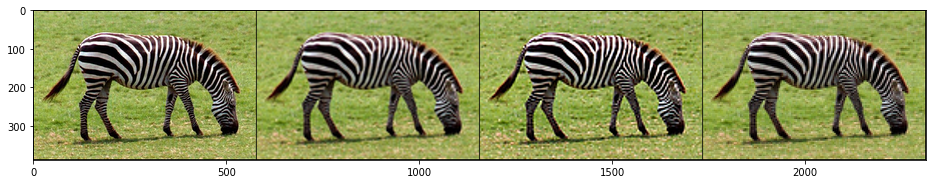

PSNR bicubic: 23.1048   PSNR nearest: 20.8212


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  if __name__ == '__main__':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  # Remove the CWD from sys.path while we load stuff.


In [4]:
# Starts here
imgs = load_LR_HR_imgs_sr(path_to_image , imsize, factor, enforse_div32)

imgs['bicubic_np'], imgs['sharp_np'], imgs['nearest_np'] = get_baselines(imgs['LR_pil'], imgs['HR_pil'])

if PLOT:
    plot_image_grid([imgs['HR_np'], imgs['bicubic_np'], imgs['sharp_np'], imgs['nearest_np']], 4,12);
    print ('PSNR bicubic: %.4f   PSNR nearest: %.4f' %  (
                                        compare_psnr(imgs['HR_np'], imgs['bicubic_np']), 
                                        compare_psnr(imgs['HR_np'], imgs['nearest_np'])))

# Set up parameters and net

In [0]:
input_depth = 32
 
INPUT =     'noise'
pad   =     'reflection'
OPT_OVER =  'net'
KERNEL_TYPE='lanczos2'

LR = 0.01
tv_weight = 0.0

OPTIMIZER = 'adam'

if factor == 4: 
    num_iter = 2000
    reg_noise_std = 0.03
elif factor == 8:
    num_iter = 4000
    reg_noise_std = 0.05
else:
    assert False, 'We did not experiment with other factors'

In [0]:
net_input = get_noise(input_depth, INPUT, (imgs['HR_pil'].size[1], imgs['HR_pil'].size[0])).type(dtype).detach()

NET_TYPE = 'skip' # UNet, ResNet
net = get_net(input_depth, 'skip', pad,
              skip_n33d=128, 
              skip_n33u=128, 
              skip_n11=4, 
              num_scales=5,
              upsample_mode='bilinear').type(dtype)

# Losses
mse = torch.nn.MSELoss().type(dtype)

img_LR_var = np_to_torch(imgs['LR_np']).type(dtype)

downsampler = Downsampler(n_planes=3, factor=factor, kernel_type=KERNEL_TYPE, phase=0.5, preserve_size=True).type(dtype)

# Define closure and optimize

In [0]:
loss=[]
def closure():
    global i, net_input,loss
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out_HR = net(net_input)
    out_LR = downsampler(out_HR)

    total_loss = mse(out_LR, img_LR_var) 
    loss=np.append(loss,total_loss.item())
    
    if tv_weight > 0:
        total_loss += tv_weight * tv_loss(out_HR)
        
    total_loss.backward()

    # Log
    psnr_LR = compare_psnr(imgs['LR_np'], torch_to_np(out_LR))
    psnr_HR = compare_psnr(imgs['HR_np'], torch_to_np(out_HR))
    print ('Iteration %05d    PSNR_LR %.3f   PSNR_HR %.3f' % (i, psnr_LR, psnr_HR), sep='\r', end='')
                      
    # History
    psnr_history.append([psnr_LR, psnr_HR])
    
    if PLOT and i % 100 == 0:
        out_HR_np = torch_to_np(out_HR)
        plot_image_grid([imgs['HR_np'], imgs['bicubic_np'], np.clip(out_HR_np, 0, 1)], factor=13, nrow=3)

    i += 1
    
    return total_loss

Starting optimization with ADAM


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2973: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.


Iteration 00000    PSNR_LR 11.820   PSNR_HR 11.394

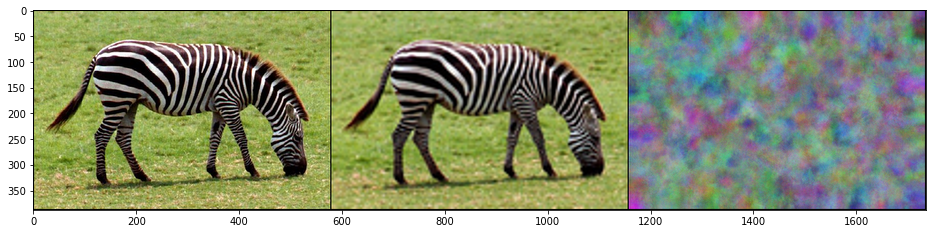

Iteration 00001    PSNR_LR 11.556   PSNR_HR 11.179Iteration 00002    PSNR_LR 12.338   PSNR_HR 11.904Iteration 00003    PSNR_LR 11.798   PSNR_HR 11.415Iteration 00004    PSNR_LR 12.327   PSNR_HR 11.895Iteration 00005    PSNR_LR 13.689   PSNR_HR 13.121Iteration 00006    PSNR_LR 13.787   PSNR_HR 13.213Iteration 00007    PSNR_LR 14.046   PSNR_HR 13.444Iteration 00008    PSNR_LR 14.333   PSNR_HR 13.696Iteration 00009    PSNR_LR 14.502   PSNR_HR 13.839Iteration 00010    PSNR_LR 14.635   PSNR_HR 13.955Iteration 00011    PSNR_LR 14.684   PSNR_HR 13.999Iteration 00012    PSNR_LR 14.861   PSNR_HR 14.152Iteration 00013    PSNR_LR 14.904   PSNR_HR 14.192Iteration 00014    PSNR_LR 15.025   PSNR_HR 14.298Iteration 00015    PSNR_LR 15.037   PSNR_HR 14.306Iteration 00016    PSNR_LR 15.117   PSNR_HR 14.376Iteration 00017    PSNR_LR 15.149   PSNR_HR 14.399Iteration 00018    PSNR_LR 15.213   PSNR_HR 14.454Iteration 00019    PSNR_LR 15.295   PSNR_HR 14.520Iteration 00020    PSNR_LR 15.190   PSNR_HR 14.430

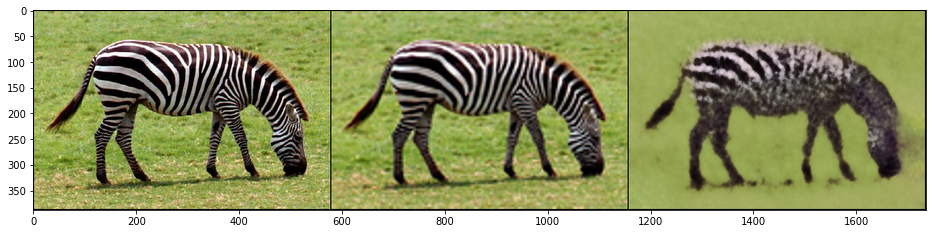

Iteration 00101    PSNR_LR 18.426   PSNR_HR 16.990Iteration 00102    PSNR_LR 18.599   PSNR_HR 17.094Iteration 00103    PSNR_LR 18.464   PSNR_HR 16.963Iteration 00104    PSNR_LR 18.586   PSNR_HR 17.085Iteration 00105    PSNR_LR 18.776   PSNR_HR 17.212Iteration 00106    PSNR_LR 18.817   PSNR_HR 17.205Iteration 00107    PSNR_LR 19.063   PSNR_HR 17.419Iteration 00108    PSNR_LR 18.844   PSNR_HR 17.291Iteration 00109    PSNR_LR 18.819   PSNR_HR 17.234Iteration 00110    PSNR_LR 19.052   PSNR_HR 17.389Iteration 00111    PSNR_LR 19.035   PSNR_HR 17.377Iteration 00112    PSNR_LR 19.103   PSNR_HR 17.436Iteration 00113    PSNR_LR 19.256   PSNR_HR 17.547Iteration 00114    PSNR_LR 19.262   PSNR_HR 17.573Iteration 00115    PSNR_LR 19.156   PSNR_HR 17.500Iteration 00116    PSNR_LR 19.337   PSNR_HR 17.635Iteration 00117    PSNR_LR 19.467   PSNR_HR 17.702Iteration 00118    PSNR_LR 19.553   PSNR_HR 17.780Iteration 00119    PSNR_LR 19.571   PSNR_HR 17.781Iteration 00120    PSNR_LR 19.677   PSNR_HR 17.871

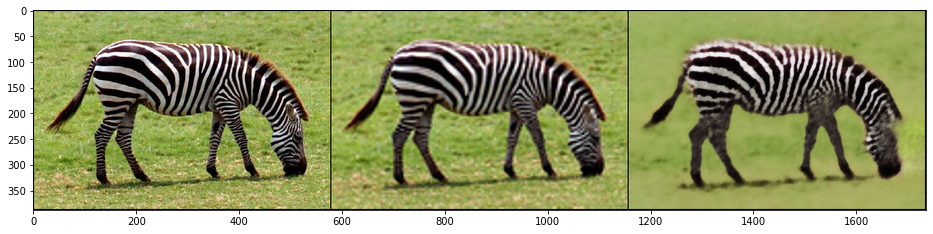

Iteration 00201    PSNR_LR 22.578   PSNR_HR 19.869Iteration 00202    PSNR_LR 22.461   PSNR_HR 19.737Iteration 00203    PSNR_LR 22.697   PSNR_HR 19.900Iteration 00204    PSNR_LR 22.533   PSNR_HR 19.828Iteration 00205    PSNR_LR 22.404   PSNR_HR 19.742Iteration 00206    PSNR_LR 22.580   PSNR_HR 19.863Iteration 00207    PSNR_LR 22.619   PSNR_HR 19.876Iteration 00208    PSNR_LR 22.763   PSNR_HR 19.990Iteration 00209    PSNR_LR 22.758   PSNR_HR 19.989Iteration 00210    PSNR_LR 22.787   PSNR_HR 20.021Iteration 00211    PSNR_LR 22.946   PSNR_HR 20.108Iteration 00212    PSNR_LR 22.846   PSNR_HR 20.015Iteration 00213    PSNR_LR 22.861   PSNR_HR 20.030Iteration 00214    PSNR_LR 22.912   PSNR_HR 20.062Iteration 00215    PSNR_LR 22.844   PSNR_HR 20.011Iteration 00216    PSNR_LR 23.024   PSNR_HR 20.168Iteration 00217    PSNR_LR 22.839   PSNR_HR 20.036Iteration 00218    PSNR_LR 23.075   PSNR_HR 20.181Iteration 00219    PSNR_LR 22.991   PSNR_HR 20.216Iteration 00220    PSNR_LR 23.156   PSNR_HR 20.235

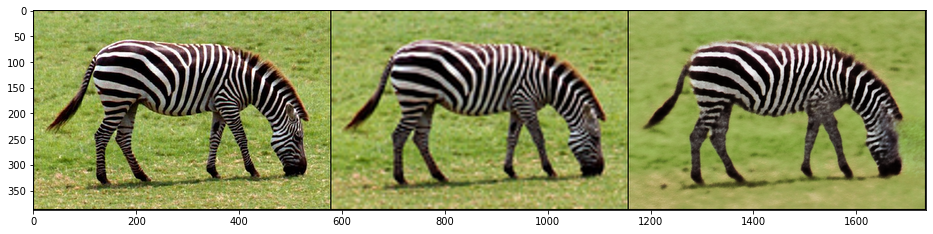

Iteration 00301    PSNR_LR 24.355   PSNR_HR 20.938Iteration 00302    PSNR_LR 24.272   PSNR_HR 20.917Iteration 00303    PSNR_LR 24.256   PSNR_HR 20.878Iteration 00304    PSNR_LR 24.392   PSNR_HR 20.974Iteration 00305    PSNR_LR 24.385   PSNR_HR 20.958Iteration 00306    PSNR_LR 24.305   PSNR_HR 20.945Iteration 00307    PSNR_LR 24.438   PSNR_HR 20.948Iteration 00308    PSNR_LR 24.485   PSNR_HR 20.983Iteration 00309    PSNR_LR 24.504   PSNR_HR 20.992Iteration 00310    PSNR_LR 24.470   PSNR_HR 20.983Iteration 00311    PSNR_LR 24.405   PSNR_HR 20.994Iteration 00312    PSNR_LR 24.573   PSNR_HR 21.035Iteration 00313    PSNR_LR 24.584   PSNR_HR 21.052Iteration 00314    PSNR_LR 24.602   PSNR_HR 21.058Iteration 00315    PSNR_LR 24.692   PSNR_HR 21.167Iteration 00316    PSNR_LR 24.717   PSNR_HR 21.121Iteration 00317    PSNR_LR 24.736   PSNR_HR 21.172Iteration 00318    PSNR_LR 24.706   PSNR_HR 21.130Iteration 00319    PSNR_LR 24.682   PSNR_HR 21.083Iteration 00320    PSNR_LR 24.756   PSNR_HR 21.125

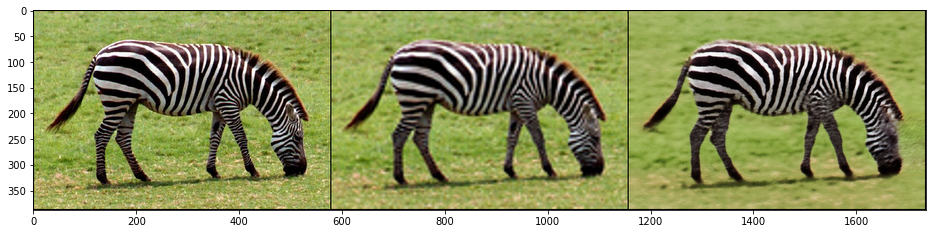

Iteration 00401    PSNR_LR 25.860   PSNR_HR 21.678Iteration 00402    PSNR_LR 25.600   PSNR_HR 21.588Iteration 00403    PSNR_LR 25.782   PSNR_HR 21.623Iteration 00404    PSNR_LR 25.638   PSNR_HR 21.572Iteration 00405    PSNR_LR 25.839   PSNR_HR 21.709Iteration 00406    PSNR_LR 25.711   PSNR_HR 21.607Iteration 00407    PSNR_LR 25.868   PSNR_HR 21.656Iteration 00408    PSNR_LR 25.729   PSNR_HR 21.597Iteration 00409    PSNR_LR 25.876   PSNR_HR 21.736Iteration 00410    PSNR_LR 25.699   PSNR_HR 21.610Iteration 00411    PSNR_LR 25.976   PSNR_HR 21.765Iteration 00412    PSNR_LR 25.822   PSNR_HR 21.697Iteration 00413    PSNR_LR 25.883   PSNR_HR 21.631Iteration 00414    PSNR_LR 25.931   PSNR_HR 21.735Iteration 00415    PSNR_LR 25.958   PSNR_HR 21.777Iteration 00416    PSNR_LR 25.927   PSNR_HR 21.746Iteration 00417    PSNR_LR 26.003   PSNR_HR 21.780Iteration 00418    PSNR_LR 26.028   PSNR_HR 21.823Iteration 00419    PSNR_LR 25.849   PSNR_HR 21.656Iteration 00420    PSNR_LR 25.941   PSNR_HR 21.787

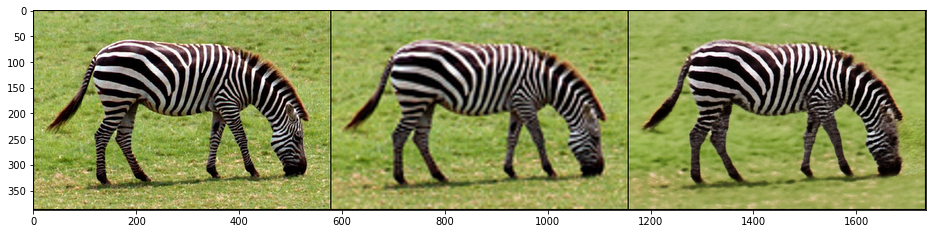

Iteration 00501    PSNR_LR 26.718   PSNR_HR 22.067Iteration 00502    PSNR_LR 26.535   PSNR_HR 21.971Iteration 00503    PSNR_LR 26.502   PSNR_HR 22.059Iteration 00504    PSNR_LR 26.627   PSNR_HR 22.002Iteration 00505    PSNR_LR 26.801   PSNR_HR 22.187Iteration 00506    PSNR_LR 26.570   PSNR_HR 22.124Iteration 00507    PSNR_LR 26.682   PSNR_HR 22.081Iteration 00508    PSNR_LR 26.785   PSNR_HR 22.191Iteration 00509    PSNR_LR 26.698   PSNR_HR 22.174Iteration 00510    PSNR_LR 26.833   PSNR_HR 22.162Iteration 00511    PSNR_LR 26.580   PSNR_HR 22.089Iteration 00512    PSNR_LR 26.897   PSNR_HR 22.208Iteration 00513    PSNR_LR 26.589   PSNR_HR 22.075Iteration 00514    PSNR_LR 26.892   PSNR_HR 22.248Iteration 00515    PSNR_LR 26.796   PSNR_HR 22.129Iteration 00516    PSNR_LR 26.930   PSNR_HR 22.164Iteration 00517    PSNR_LR 26.782   PSNR_HR 22.150Iteration 00518    PSNR_LR 27.000   PSNR_HR 22.212Iteration 00519    PSNR_LR 26.930   PSNR_HR 22.198Iteration 00520    PSNR_LR 27.026   PSNR_HR 22.172

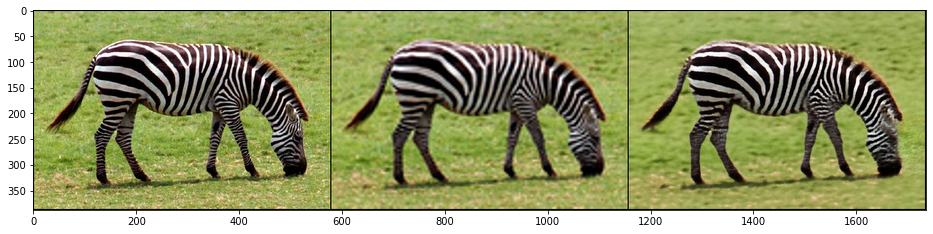

Iteration 00601    PSNR_LR 27.331   PSNR_HR 22.414Iteration 00602    PSNR_LR 27.705   PSNR_HR 22.565Iteration 00603    PSNR_LR 27.415   PSNR_HR 22.410Iteration 00604    PSNR_LR 27.366   PSNR_HR 22.460Iteration 00605    PSNR_LR 27.489   PSNR_HR 22.403Iteration 00606    PSNR_LR 27.686   PSNR_HR 22.560Iteration 00607    PSNR_LR 27.574   PSNR_HR 22.509Iteration 00608    PSNR_LR 27.580   PSNR_HR 22.515Iteration 00609    PSNR_LR 27.660   PSNR_HR 22.545Iteration 00610    PSNR_LR 27.601   PSNR_HR 22.510Iteration 00611    PSNR_LR 27.653   PSNR_HR 22.544Iteration 00612    PSNR_LR 27.733   PSNR_HR 22.503Iteration 00613    PSNR_LR 27.685   PSNR_HR 22.444Iteration 00614    PSNR_LR 27.681   PSNR_HR 22.538Iteration 00615    PSNR_LR 27.656   PSNR_HR 22.483Iteration 00616    PSNR_LR 27.610   PSNR_HR 22.465Iteration 00617    PSNR_LR 27.720   PSNR_HR 22.465Iteration 00618    PSNR_LR 27.774   PSNR_HR 22.568Iteration 00619    PSNR_LR 27.641   PSNR_HR 22.522Iteration 00620    PSNR_LR 27.521   PSNR_HR 22.464

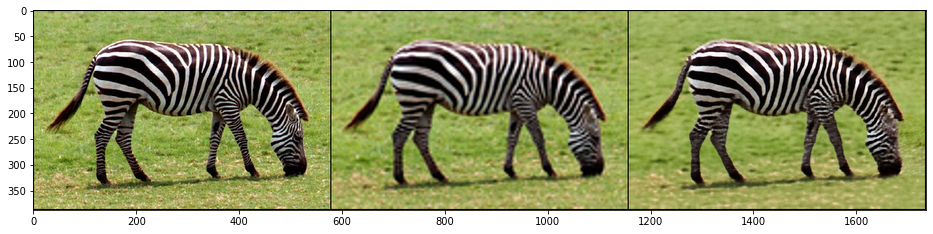

Iteration 00701    PSNR_LR 28.265   PSNR_HR 22.763Iteration 00702    PSNR_LR 28.302   PSNR_HR 22.764Iteration 00703    PSNR_LR 28.234   PSNR_HR 22.770Iteration 00704    PSNR_LR 28.295   PSNR_HR 22.799Iteration 00705    PSNR_LR 28.324   PSNR_HR 22.777Iteration 00706    PSNR_LR 28.359   PSNR_HR 22.832Iteration 00707    PSNR_LR 28.245   PSNR_HR 22.766Iteration 00708    PSNR_LR 28.006   PSNR_HR 22.678Iteration 00709    PSNR_LR 28.152   PSNR_HR 22.822Iteration 00710    PSNR_LR 28.370   PSNR_HR 22.801Iteration 00711    PSNR_LR 28.275   PSNR_HR 22.773Iteration 00712    PSNR_LR 28.369   PSNR_HR 22.850Iteration 00713    PSNR_LR 28.332   PSNR_HR 22.804Iteration 00714    PSNR_LR 28.508   PSNR_HR 22.883Iteration 00715    PSNR_LR 28.311   PSNR_HR 22.761Iteration 00716    PSNR_LR 28.317   PSNR_HR 22.696Iteration 00717    PSNR_LR 28.342   PSNR_HR 22.778Iteration 00718    PSNR_LR 28.161   PSNR_HR 22.791Iteration 00719    PSNR_LR 28.411   PSNR_HR 22.816Iteration 00720    PSNR_LR 28.368   PSNR_HR 22.792

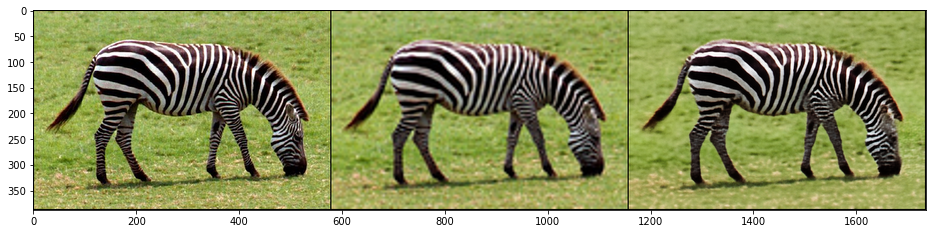

Iteration 00801    PSNR_LR 28.900   PSNR_HR 23.016Iteration 00802    PSNR_LR 29.045   PSNR_HR 23.101Iteration 00803    PSNR_LR 28.861   PSNR_HR 23.027Iteration 00804    PSNR_LR 28.846   PSNR_HR 22.993Iteration 00805    PSNR_LR 28.907   PSNR_HR 23.046Iteration 00806    PSNR_LR 28.976   PSNR_HR 23.031Iteration 00807    PSNR_LR 28.954   PSNR_HR 23.059Iteration 00808    PSNR_LR 28.895   PSNR_HR 22.970Iteration 00809    PSNR_LR 28.985   PSNR_HR 23.040Iteration 00810    PSNR_LR 28.885   PSNR_HR 23.041Iteration 00811    PSNR_LR 28.632   PSNR_HR 22.925Iteration 00812    PSNR_LR 29.004   PSNR_HR 23.034Iteration 00813    PSNR_LR 28.897   PSNR_HR 23.009Iteration 00814    PSNR_LR 28.916   PSNR_HR 22.995Iteration 00815    PSNR_LR 28.904   PSNR_HR 22.999Iteration 00816    PSNR_LR 28.945   PSNR_HR 23.049Iteration 00817    PSNR_LR 29.085   PSNR_HR 23.096Iteration 00818    PSNR_LR 29.065   PSNR_HR 23.105Iteration 00819    PSNR_LR 29.015   PSNR_HR 23.011Iteration 00820    PSNR_LR 28.980   PSNR_HR 23.000

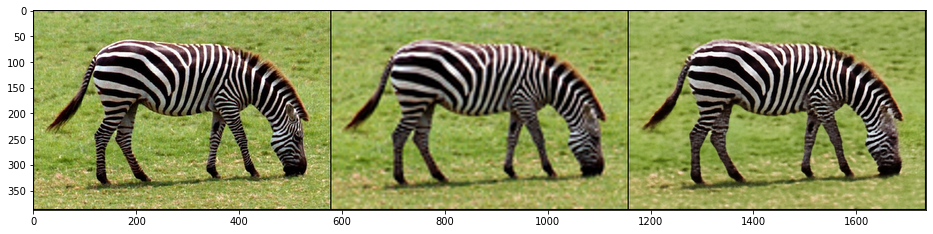

Iteration 00901    PSNR_LR 29.457   PSNR_HR 23.223Iteration 00902    PSNR_LR 29.231   PSNR_HR 23.190Iteration 00903    PSNR_LR 29.361   PSNR_HR 23.173Iteration 00904    PSNR_LR 29.323   PSNR_HR 23.178Iteration 00905    PSNR_LR 29.473   PSNR_HR 23.218Iteration 00906    PSNR_LR 29.285   PSNR_HR 23.108Iteration 00907    PSNR_LR 29.377   PSNR_HR 23.226Iteration 00908    PSNR_LR 29.511   PSNR_HR 23.171Iteration 00909    PSNR_LR 29.221   PSNR_HR 23.012Iteration 00910    PSNR_LR 29.353   PSNR_HR 23.224Iteration 00911    PSNR_LR 29.471   PSNR_HR 23.189Iteration 00912    PSNR_LR 29.433   PSNR_HR 23.156Iteration 00913    PSNR_LR 29.368   PSNR_HR 23.222Iteration 00914    PSNR_LR 29.598   PSNR_HR 23.237Iteration 00915    PSNR_LR 29.475   PSNR_HR 23.167Iteration 00916    PSNR_LR 29.444   PSNR_HR 23.257Iteration 00917    PSNR_LR 29.398   PSNR_HR 23.174Iteration 00918    PSNR_LR 29.378   PSNR_HR 23.154Iteration 00919    PSNR_LR 29.298   PSNR_HR 23.238Iteration 00920    PSNR_LR 29.550   PSNR_HR 23.287

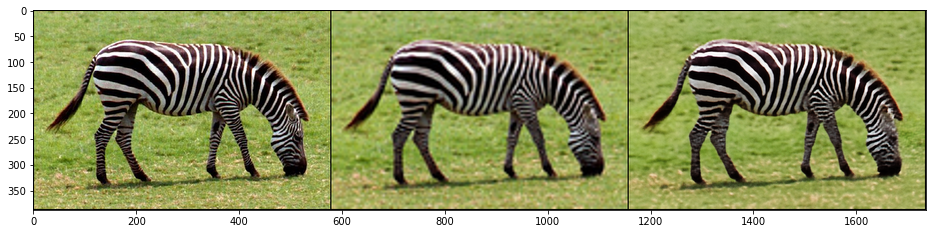

Iteration 01001    PSNR_LR 29.859   PSNR_HR 23.359Iteration 01002    PSNR_LR 29.866   PSNR_HR 23.336Iteration 01003    PSNR_LR 29.854   PSNR_HR 23.340Iteration 01004    PSNR_LR 29.984   PSNR_HR 23.399Iteration 01005    PSNR_LR 29.859   PSNR_HR 23.269Iteration 01006    PSNR_LR 30.111   PSNR_HR 23.386Iteration 01007    PSNR_LR 29.985   PSNR_HR 23.378Iteration 01008    PSNR_LR 29.848   PSNR_HR 23.320Iteration 01009    PSNR_LR 29.761   PSNR_HR 23.302Iteration 01010    PSNR_LR 30.009   PSNR_HR 23.375Iteration 01011    PSNR_LR 29.895   PSNR_HR 23.308Iteration 01012    PSNR_LR 29.813   PSNR_HR 23.296Iteration 01013    PSNR_LR 30.077   PSNR_HR 23.414Iteration 01014    PSNR_LR 30.019   PSNR_HR 23.367Iteration 01015    PSNR_LR 29.914   PSNR_HR 23.369Iteration 01016    PSNR_LR 29.870   PSNR_HR 23.273Iteration 01017    PSNR_LR 29.813   PSNR_HR 23.243Iteration 01018    PSNR_LR 29.841   PSNR_HR 23.334Iteration 01019    PSNR_LR 29.869   PSNR_HR 23.309Iteration 01020    PSNR_LR 29.972   PSNR_HR 23.289

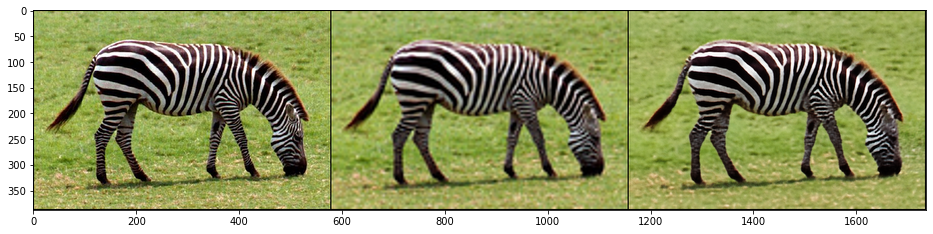

Iteration 01101    PSNR_LR 30.162   PSNR_HR 23.403Iteration 01102    PSNR_LR 29.923   PSNR_HR 23.402Iteration 01103    PSNR_LR 30.322   PSNR_HR 23.416Iteration 01104    PSNR_LR 30.301   PSNR_HR 23.471Iteration 01105    PSNR_LR 30.350   PSNR_HR 23.510Iteration 01106    PSNR_LR 30.321   PSNR_HR 23.505Iteration 01107    PSNR_LR 30.376   PSNR_HR 23.514Iteration 01108    PSNR_LR 30.355   PSNR_HR 23.493Iteration 01109    PSNR_LR 30.303   PSNR_HR 23.476Iteration 01110    PSNR_LR 30.348   PSNR_HR 23.476Iteration 01111    PSNR_LR 30.523   PSNR_HR 23.503Iteration 01112    PSNR_LR 30.450   PSNR_HR 23.471Iteration 01113    PSNR_LR 30.448   PSNR_HR 23.489Iteration 01114    PSNR_LR 30.273   PSNR_HR 23.478Iteration 01115    PSNR_LR 30.336   PSNR_HR 23.467Iteration 01116    PSNR_LR 30.405   PSNR_HR 23.541Iteration 01117    PSNR_LR 30.394   PSNR_HR 23.436Iteration 01118    PSNR_LR 30.325   PSNR_HR 23.441Iteration 01119    PSNR_LR 30.238   PSNR_HR 23.441Iteration 01120    PSNR_LR 30.320   PSNR_HR 23.444

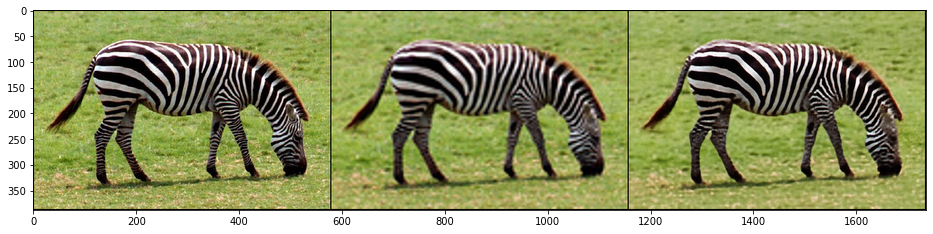

Iteration 01201    PSNR_LR 30.727   PSNR_HR 23.583Iteration 01202    PSNR_LR 30.543   PSNR_HR 23.502Iteration 01203    PSNR_LR 30.528   PSNR_HR 23.593Iteration 01204    PSNR_LR 30.518   PSNR_HR 23.579Iteration 01205    PSNR_LR 30.775   PSNR_HR 23.672Iteration 01206    PSNR_LR 30.784   PSNR_HR 23.596Iteration 01207    PSNR_LR 30.595   PSNR_HR 23.495Iteration 01208    PSNR_LR 30.688   PSNR_HR 23.562Iteration 01209    PSNR_LR 30.631   PSNR_HR 23.583Iteration 01210    PSNR_LR 30.638   PSNR_HR 23.572Iteration 01211    PSNR_LR 30.809   PSNR_HR 23.588Iteration 01212    PSNR_LR 30.579   PSNR_HR 23.520Iteration 01213    PSNR_LR 30.807   PSNR_HR 23.609Iteration 01214    PSNR_LR 30.727   PSNR_HR 23.577Iteration 01215    PSNR_LR 31.015   PSNR_HR 23.674Iteration 01216    PSNR_LR 30.768   PSNR_HR 23.588Iteration 01217    PSNR_LR 30.803   PSNR_HR 23.558Iteration 01218    PSNR_LR 30.926   PSNR_HR 23.608Iteration 01219    PSNR_LR 30.780   PSNR_HR 23.591Iteration 01220    PSNR_LR 30.737   PSNR_HR 23.638

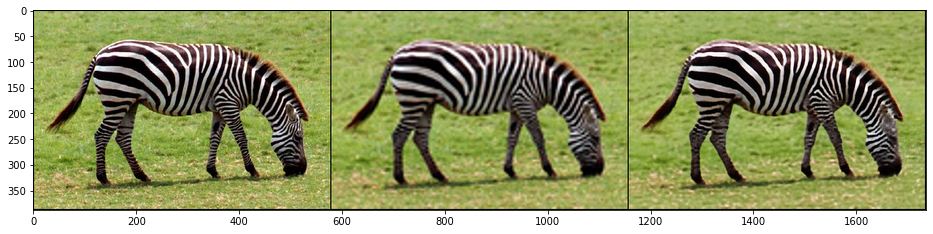

Iteration 01301    PSNR_LR 31.099   PSNR_HR 23.670Iteration 01302    PSNR_LR 31.132   PSNR_HR 23.652Iteration 01303    PSNR_LR 31.069   PSNR_HR 23.635Iteration 01304    PSNR_LR 30.950   PSNR_HR 23.645Iteration 01305    PSNR_LR 31.156   PSNR_HR 23.680Iteration 01306    PSNR_LR 31.256   PSNR_HR 23.745Iteration 01307    PSNR_LR 31.002   PSNR_HR 23.625Iteration 01308    PSNR_LR 31.208   PSNR_HR 23.696Iteration 01309    PSNR_LR 31.095   PSNR_HR 23.696Iteration 01310    PSNR_LR 31.160   PSNR_HR 23.665Iteration 01311    PSNR_LR 31.212   PSNR_HR 23.649Iteration 01312    PSNR_LR 30.976   PSNR_HR 23.677Iteration 01313    PSNR_LR 30.912   PSNR_HR 23.622Iteration 01314    PSNR_LR 31.053   PSNR_HR 23.688Iteration 01315    PSNR_LR 31.206   PSNR_HR 23.709Iteration 01316    PSNR_LR 31.002   PSNR_HR 23.630Iteration 01317    PSNR_LR 31.059   PSNR_HR 23.692Iteration 01318    PSNR_LR 30.979   PSNR_HR 23.670Iteration 01319    PSNR_LR 30.906   PSNR_HR 23.653Iteration 01320    PSNR_LR 31.025   PSNR_HR 23.675

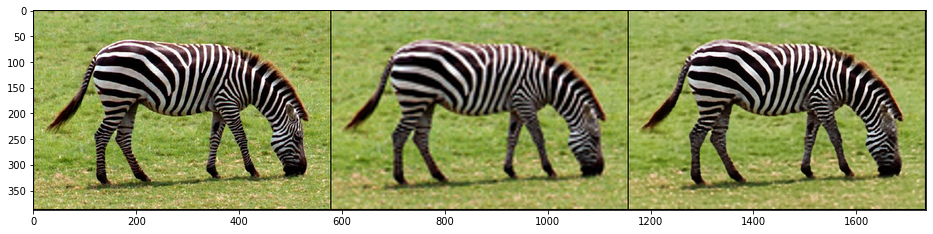

Iteration 01401    PSNR_LR 31.380   PSNR_HR 23.720Iteration 01402    PSNR_LR 31.238   PSNR_HR 23.659Iteration 01403    PSNR_LR 31.257   PSNR_HR 23.746Iteration 01404    PSNR_LR 31.405   PSNR_HR 23.777Iteration 01405    PSNR_LR 31.334   PSNR_HR 23.687Iteration 01406    PSNR_LR 31.143   PSNR_HR 23.717Iteration 01407    PSNR_LR 31.077   PSNR_HR 23.643Iteration 01408    PSNR_LR 31.411   PSNR_HR 23.752Iteration 01409    PSNR_LR 31.138   PSNR_HR 23.768Iteration 01410    PSNR_LR 31.202   PSNR_HR 23.706Iteration 01411    PSNR_LR 31.288   PSNR_HR 23.702Iteration 01412    PSNR_LR 31.336   PSNR_HR 23.738Iteration 01413    PSNR_LR 31.266   PSNR_HR 23.704Iteration 01414    PSNR_LR 31.429   PSNR_HR 23.826Iteration 01415    PSNR_LR 31.430   PSNR_HR 23.744Iteration 01416    PSNR_LR 31.325   PSNR_HR 23.743Iteration 01417    PSNR_LR 31.425   PSNR_HR 23.714Iteration 01418    PSNR_LR 31.226   PSNR_HR 23.753Iteration 01419    PSNR_LR 31.433   PSNR_HR 23.807Iteration 01420    PSNR_LR 31.274   PSNR_HR 23.698

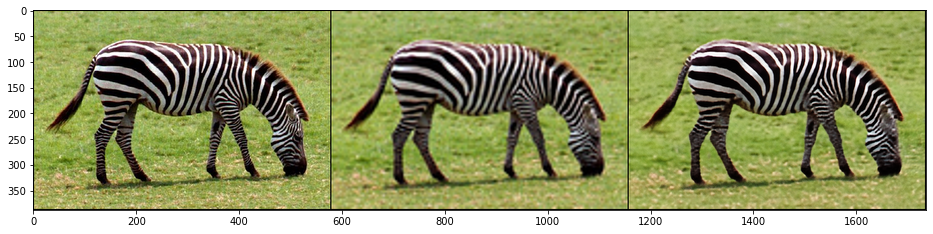

Iteration 01501    PSNR_LR 31.679   PSNR_HR 23.846Iteration 01502    PSNR_LR 31.562   PSNR_HR 23.830Iteration 01503    PSNR_LR 31.618   PSNR_HR 23.789Iteration 01504    PSNR_LR 31.707   PSNR_HR 23.801Iteration 01505    PSNR_LR 31.690   PSNR_HR 23.795Iteration 01506    PSNR_LR 31.639   PSNR_HR 23.773Iteration 01507    PSNR_LR 31.717   PSNR_HR 23.856Iteration 01508    PSNR_LR 31.537   PSNR_HR 23.845Iteration 01509    PSNR_LR 31.010   PSNR_HR 23.661Iteration 01510    PSNR_LR 30.809   PSNR_HR 23.715Iteration 01511    PSNR_LR 31.325   PSNR_HR 23.703Iteration 01512    PSNR_LR 31.783   PSNR_HR 23.850Iteration 01513    PSNR_LR 31.512   PSNR_HR 23.849Iteration 01514    PSNR_LR 31.261   PSNR_HR 23.707Iteration 01515    PSNR_LR 31.717   PSNR_HR 23.857Iteration 01516    PSNR_LR 31.636   PSNR_HR 23.888Iteration 01517    PSNR_LR 31.329   PSNR_HR 23.731Iteration 01518    PSNR_LR 31.546   PSNR_HR 23.831Iteration 01519    PSNR_LR 31.751   PSNR_HR 23.848Iteration 01520    PSNR_LR 31.542   PSNR_HR 23.791

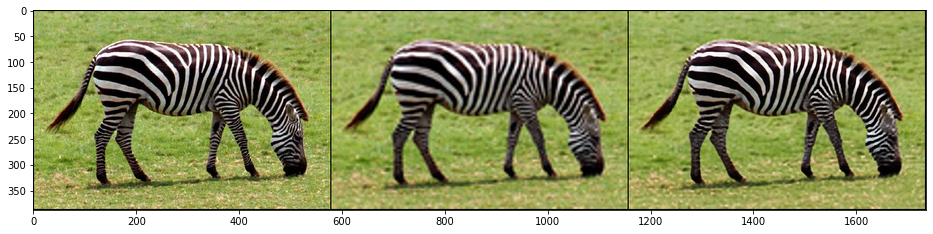

Iteration 01601    PSNR_LR 31.765   PSNR_HR 23.826Iteration 01602    PSNR_LR 31.911   PSNR_HR 23.910Iteration 01603    PSNR_LR 32.024   PSNR_HR 23.921Iteration 01604    PSNR_LR 31.944   PSNR_HR 23.876Iteration 01605    PSNR_LR 32.017   PSNR_HR 23.916Iteration 01606    PSNR_LR 31.853   PSNR_HR 23.824Iteration 01607    PSNR_LR 32.045   PSNR_HR 23.917Iteration 01608    PSNR_LR 32.023   PSNR_HR 23.913Iteration 01609    PSNR_LR 31.705   PSNR_HR 23.774Iteration 01610    PSNR_LR 31.951   PSNR_HR 23.913Iteration 01611    PSNR_LR 31.965   PSNR_HR 23.889Iteration 01612    PSNR_LR 31.846   PSNR_HR 23.853Iteration 01613    PSNR_LR 32.046   PSNR_HR 23.914Iteration 01614    PSNR_LR 31.906   PSNR_HR 23.857Iteration 01615    PSNR_LR 31.972   PSNR_HR 23.900Iteration 01616    PSNR_LR 31.927   PSNR_HR 23.941Iteration 01617    PSNR_LR 32.015   PSNR_HR 23.914Iteration 01618    PSNR_LR 32.011   PSNR_HR 23.901Iteration 01619    PSNR_LR 31.883   PSNR_HR 23.946Iteration 01620    PSNR_LR 31.941   PSNR_HR 23.900

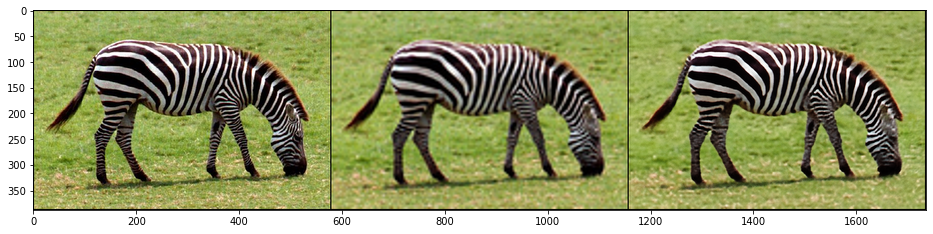

Iteration 01701    PSNR_LR 32.428   PSNR_HR 23.976Iteration 01702    PSNR_LR 32.261   PSNR_HR 23.977Iteration 01703    PSNR_LR 32.262   PSNR_HR 23.945Iteration 01704    PSNR_LR 32.214   PSNR_HR 23.945Iteration 01705    PSNR_LR 32.363   PSNR_HR 24.011Iteration 01706    PSNR_LR 32.201   PSNR_HR 23.904Iteration 01707    PSNR_LR 32.088   PSNR_HR 23.939Iteration 01708    PSNR_LR 32.224   PSNR_HR 23.898Iteration 01709    PSNR_LR 32.406   PSNR_HR 23.966Iteration 01710    PSNR_LR 32.416   PSNR_HR 24.000Iteration 01711    PSNR_LR 32.153   PSNR_HR 23.936Iteration 01712    PSNR_LR 32.031   PSNR_HR 23.974Iteration 01713    PSNR_LR 32.297   PSNR_HR 23.946Iteration 01714    PSNR_LR 32.397   PSNR_HR 23.943Iteration 01715    PSNR_LR 32.134   PSNR_HR 23.999Iteration 01716    PSNR_LR 32.133   PSNR_HR 23.923Iteration 01717    PSNR_LR 32.346   PSNR_HR 23.957Iteration 01718    PSNR_LR 32.311   PSNR_HR 24.008Iteration 01719    PSNR_LR 32.143   PSNR_HR 23.924Iteration 01720    PSNR_LR 32.231   PSNR_HR 24.032

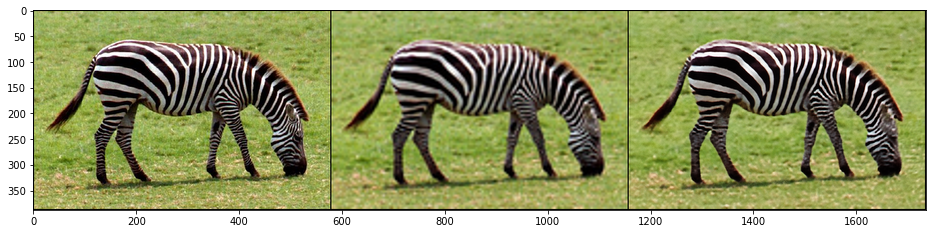

Iteration 01801    PSNR_LR 32.408   PSNR_HR 24.001Iteration 01802    PSNR_LR 32.493   PSNR_HR 24.068Iteration 01803    PSNR_LR 32.513   PSNR_HR 24.039Iteration 01804    PSNR_LR 32.372   PSNR_HR 23.991Iteration 01805    PSNR_LR 32.451   PSNR_HR 23.951Iteration 01806    PSNR_LR 32.369   PSNR_HR 23.957Iteration 01807    PSNR_LR 32.585   PSNR_HR 24.030Iteration 01808    PSNR_LR 32.602   PSNR_HR 24.048Iteration 01809    PSNR_LR 32.428   PSNR_HR 24.022Iteration 01810    PSNR_LR 32.662   PSNR_HR 24.042Iteration 01811    PSNR_LR 32.433   PSNR_HR 24.006Iteration 01812    PSNR_LR 32.483   PSNR_HR 23.989Iteration 01813    PSNR_LR 32.685   PSNR_HR 24.058Iteration 01814    PSNR_LR 32.725   PSNR_HR 24.105Iteration 01815    PSNR_LR 32.588   PSNR_HR 24.086Iteration 01816    PSNR_LR 32.670   PSNR_HR 24.025Iteration 01817    PSNR_LR 32.545   PSNR_HR 23.981Iteration 01818    PSNR_LR 32.595   PSNR_HR 23.997Iteration 01819    PSNR_LR 32.644   PSNR_HR 24.072Iteration 01820    PSNR_LR 32.469   PSNR_HR 24.038

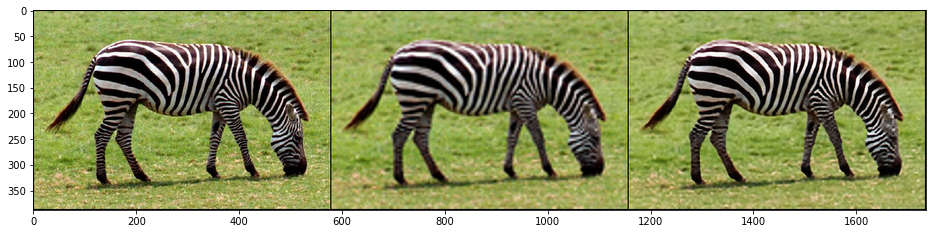

Iteration 01901    PSNR_LR 32.763   PSNR_HR 24.071Iteration 01902    PSNR_LR 32.542   PSNR_HR 24.093Iteration 01903    PSNR_LR 32.080   PSNR_HR 23.904Iteration 01904    PSNR_LR 32.369   PSNR_HR 24.041Iteration 01905    PSNR_LR 32.740   PSNR_HR 24.073Iteration 01906    PSNR_LR 32.253   PSNR_HR 23.941Iteration 01907    PSNR_LR 32.464   PSNR_HR 24.016Iteration 01908    PSNR_LR 32.375   PSNR_HR 24.020Iteration 01909    PSNR_LR 32.189   PSNR_HR 23.982Iteration 01910    PSNR_LR 32.724   PSNR_HR 24.062Iteration 01911    PSNR_LR 32.527   PSNR_HR 24.006Iteration 01912    PSNR_LR 32.237   PSNR_HR 24.028Iteration 01913    PSNR_LR 32.667   PSNR_HR 24.050Iteration 01914    PSNR_LR 32.823   PSNR_HR 24.097Iteration 01915    PSNR_LR 32.592   PSNR_HR 24.112Iteration 01916    PSNR_LR 32.224   PSNR_HR 23.964Iteration 01917    PSNR_LR 32.571   PSNR_HR 24.047Iteration 01918    PSNR_LR 32.781   PSNR_HR 24.067Iteration 01919    PSNR_LR 32.523   PSNR_HR 24.008Iteration 01920    PSNR_LR 32.329   PSNR_HR 24.012

In [8]:
psnr_history = [] 
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

i = 0
p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2973: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


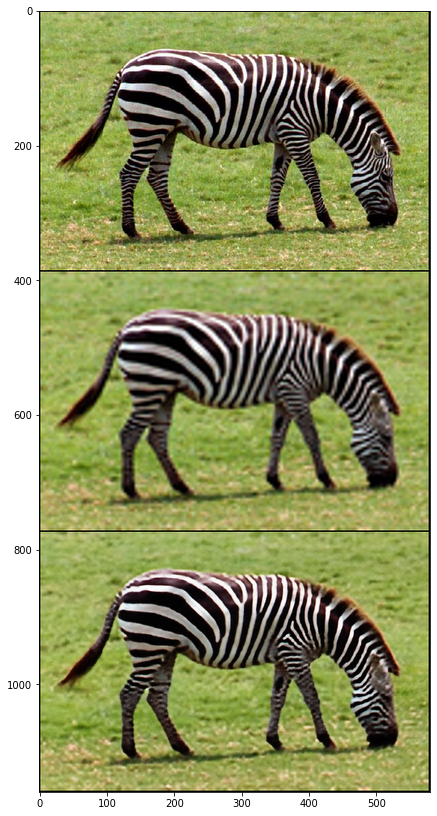

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


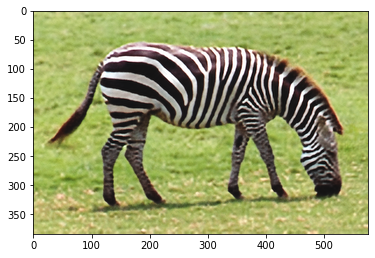

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


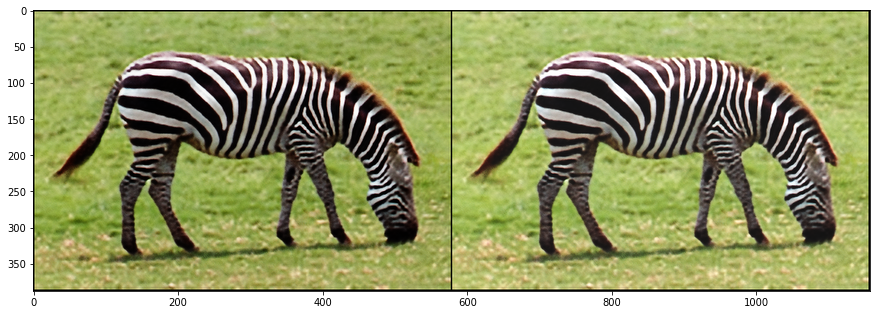

In [10]:
out_HR_np = np.clip(torch_to_np(net(net_input)), 0, 1)
result_deep_prior = put_in_center(out_HR_np, imgs['orig_np'].shape[1:])

# For the paper we acually took `_bicubic.png` files from LapSRN viewer and used `result_deep_prior` as our result
plot_image_grid([imgs['HR_np'],
                 imgs['bicubic_np'],
                 out_HR_np], factor=4, nrow=1);

new_out_np=out_HR_np+0.07
plot_image_grid([new_out_np], factor=5);
plot_image_grid([np.clip(out_HR_np, 0, 1), new_out_np], factor=13);

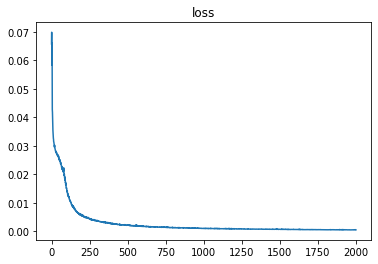

In [11]:
# print(loss)
plt.title('loss')
plt.plot(loss)

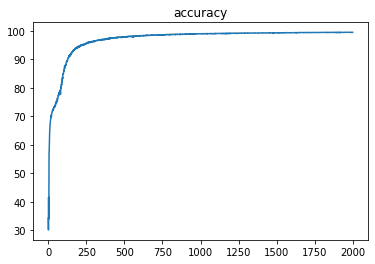

In [12]:
acc=[]
acc= 100-(loss*1000)
plt.show()
# acc=acc[:-500]
# print(acc[-1])
# print (acc.shape)

plt.title('accuracy')
plt.plot(acc)
plt.show()
# plt.title('psnr')
# plt.plot(PSNR[:,0])

In [0]:
!apt install caffe-cuda

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import caffe
import os
import skimage.color as color
import scipy.ndimage.interpolation as sni

%matplotlib inline
plt.rcParams['figure.figsize'] = (12, 6)